In [1]:
import pandas as pd
import numpy as np
from scipy.stats.mstats import mode
from sklearn.preprocessing import LabelEncoder

import matplotlib.pylab as plt
%matplotlib inline
from matplotlib.pylab import rcParams
rcParams['figure.figsize']= 12,4
from scipy.stats import pearsonr
import seaborn as sns

In [2]:
#Import train and test data
train=pd.read_csv('Desktop/Kaggle/Allstate/train.csv')

In [3]:
test=pd.read_csv('Desktop/Kaggle/Allstate/test.csv')

In [4]:
train.head()

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,...,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
0,1,A,B,A,B,A,A,A,A,B,...,0.718367,0.335060,0.30260,0.67135,0.83510,0.569745,0.594646,0.822493,0.714843,2213.18
1,2,A,B,A,A,A,A,A,A,B,...,0.438917,0.436585,0.60087,0.35127,0.43919,0.338312,0.366307,0.611431,0.304496,1283.60
2,5,A,B,A,A,B,A,A,A,B,...,0.289648,0.315545,0.27320,0.26076,0.32446,0.381398,0.373424,0.195709,0.774425,3005.09
3,10,B,B,A,B,A,A,A,A,B,...,0.440945,0.391128,0.31796,0.32128,0.44467,0.327915,0.321570,0.605077,0.602642,939.85
4,11,A,B,A,B,A,A,A,A,B,...,0.178193,0.247408,0.24564,0.22089,0.21230,0.204687,0.202213,0.246011,0.432606,2763.85


In [5]:
test.head()

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,...,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14
0,4,A,B,A,A,A,A,A,A,B,...,0.281143,0.466591,0.317681,0.61229,0.34365,0.38016,0.377724,0.369858,0.704052,0.392562
1,6,A,B,A,B,A,A,A,A,B,...,0.836443,0.482425,0.443760,0.71330,0.51890,0.60401,0.689039,0.675759,0.453468,0.208045
2,9,A,B,A,B,B,A,B,A,B,...,0.718531,0.212308,0.325779,0.29758,0.34365,0.30529,0.245410,0.241676,0.258586,0.297232
3,12,A,A,A,A,B,A,A,A,A,...,0.397069,0.369930,0.342355,0.40028,0.33237,0.31480,0.348867,0.341872,0.592264,0.555955
4,15,B,A,A,A,A,B,A,A,A,...,0.302678,0.398862,0.391833,0.23688,0.43731,0.50556,0.359572,0.352251,0.301535,0.825823


In [6]:
#total number of rows in train
train.shape

(188318, 132)

In [7]:
#total number of rows in test
test.shape

(125546, 131)

In [8]:
# number of categorical variables in train
(train.dtypes==object).sum()

116

In [9]:
# number of continuous variables in train
(train.dtypes==float).sum()

15

In [10]:
# number of categorical variables in test
(test.dtypes==object).sum()

116

In [11]:
# number of continuous variables in test
(test.dtypes==float).sum()

14

In [12]:
# combine both the datasets into one
train['source']='train'
test['source']='test'
data=pd.concat([train,test],ignore_index=True)
data.shape

(313864, 133)

In [13]:
data.head()

,cat1,cat10,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,...,cont3,cont4,cont5,cont6,cont7,cont8,cont9,id,loss,source
0,A,A,B,G,A,A,I,E,G,J,...,0.187583,0.789639,0.310061,0.718367,0.335060,0.30260,0.67135,1,2213.18,train
1,A,B,L,F,A,A,E,E,I,K,...,0.592681,0.614134,0.885834,0.438917,0.436585,0.60087,0.35127,2,1283.60,train
2,A,B,L,O,A,B,E,F,H,F,...,0.484196,0.236924,0.397069,0.289648,0.315545,0.27320,0.26076,5,3005.09,train
3,B,A,I,D,A,A,E,E,I,K,...,0.527991,0.373816,0.422268,0.440945,0.391128,0.31796,0.32128,10,939.85,train
4,A,B,F,J,A,A,D,E,K,G,...,0.527991,0.473202,0.704268,0.178193,0.247408,0.24564,0.22089,11,2763.85,train


In [14]:
# check for null values
data.apply(lambda x: sum(x.isnull()))

cat1           0
cat10          0
cat100         0
cat101         0
cat102         0
cat103         0
cat104         0
cat105         0
cat106         0
cat107         0
cat108         0
cat109         0
cat11          0
cat110         0
cat111         0
cat112         0
cat113         0
cat114         0
cat115         0
cat116         0
cat12          0
cat13          0
cat14          0
cat15          0
cat16          0
cat17          0
cat18          0
cat19          0
cat2           0
cat20          0
           ...  
cat88          0
cat89          0
cat9           0
cat90          0
cat91          0
cat92          0
cat93          0
cat94          0
cat95          0
cat96          0
cat97          0
cat98          0
cat99          0
cont1          0
cont10         0
cont11         0
cont12         0
cont13         0
cont14         0
cont2          0
cont3          0
cont4          0
cont5          0
cont6          0
cont7          0
cont8          0
cont9          0
id            

Distribution of loss value

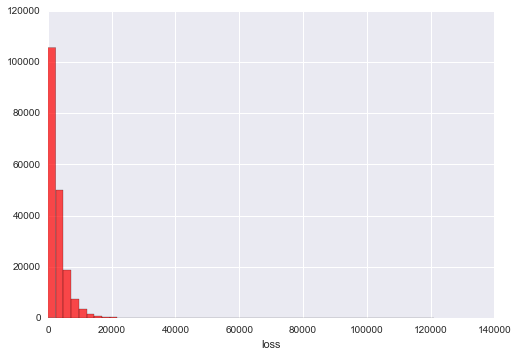

In [15]:
sns.distplot(train['loss'],color= 'r',hist_kws={'alpha':0.7},kde = False)

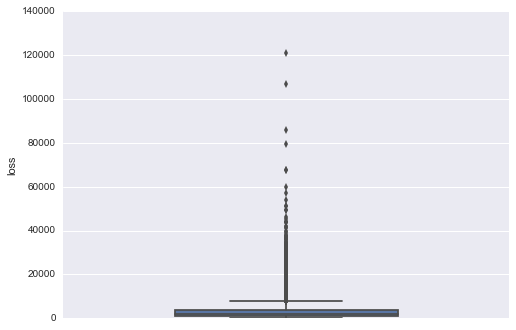

In [16]:
sns.boxplot(y="loss",width=0.5,data=train)

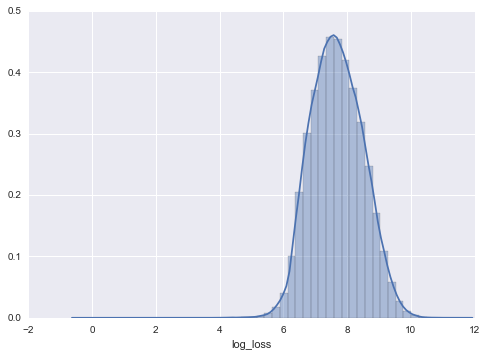

In [17]:
train['log_loss']=train['loss'].apply(lambda x: np.log(x))
sns.distplot(train['log_loss'])

Univariate and Multivariate analysis of continuous variables

In [18]:
train.describe()

,id,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss,log_loss
count,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000
mean,294135.982561,0.493861,0.507188,0.498918,0.491812,0.487428,0.490945,0.484970,0.486437,0.485506,0.498066,0.493511,0.493150,0.493138,0.495717,3037.337686,7.685268
std,169336.084867,0.187640,0.207202,0.202105,0.211292,0.209027,0.205273,0.178450,0.199370,0.181660,0.185877,0.209737,0.209427,0.212777,0.222488,2904.086186,0.811868
min,1.000000,0.000016,0.001149,0.002634,0.176921,0.281143,0.012683,0.069503,0.236880,0.000080,0.000000,0.035321,0.036232,0.000228,0.179722,0.670000,-0.400478
25%,147748.250000,0.346090,0.358319,0.336963,0.327354,0.281143,0.336105,0.350175,0.312800,0.358970,0.364580,0.310961,0.311661,0.315758,0.294610,1204.460000,7.093787
50%,294539.500000,0.475784,0.555782,0.527991,0.452887,0.422268,0.440945,0.438285,0.441060,0.441450,0.461190,0.457203,0.462286,0.363547,0.407403,2115.570000,7.657080
75%,440680.500000,0.623912,0.681761,0.634224,0.652072,0.643315,0.655021,0.591045,0.623580,0.566820,0.614590,0.678924,0.675759,0.689974,0.724623,3864.045000,8.259470
max,587633.000000,0.984975,0.862654,0.944251,0.954297,0.983674,0.997162,1.000000,0.980200,0.995400,0.994980,0.998742,0.998484,0.988494,0.844848,121012.250000,11.703647


C:\Anaconda3\lib\site-packages\seaborn\categorical.py:2171: UserWarning: The boxplot API has been changed. Attempting to adjust your arguments for the new API (which might not work). Please update your code. See the version 0.6 release notes for more info.
  warnings.warn(msg, UserWarning)


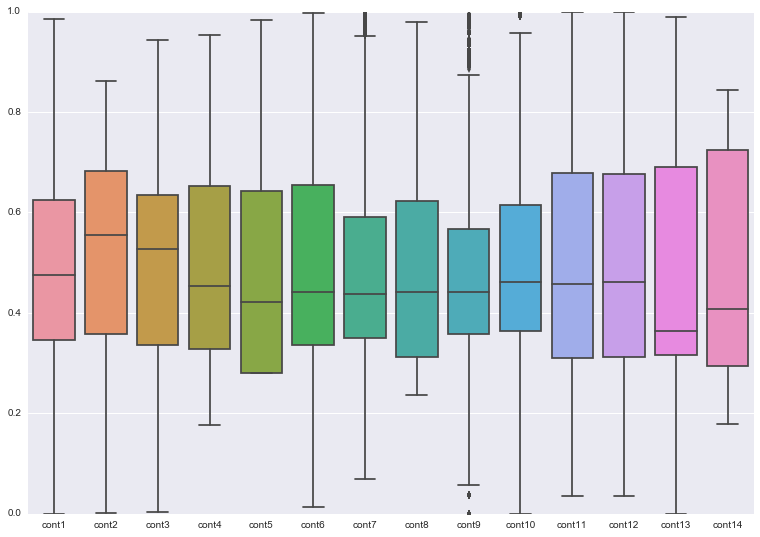

In [21]:
contFeatureslist = []
for colName,x in train.iloc[1,:].iteritems():
    if(not str(x).isalpha()):
        contFeatureslist.append(colName)
contFeatureslist.remove("id")
contFeatureslist.remove("loss")
contFeatureslist.remove("log_loss")
plt.figure(figsize=(13,9))
sns.boxplot(train[contFeatureslist])

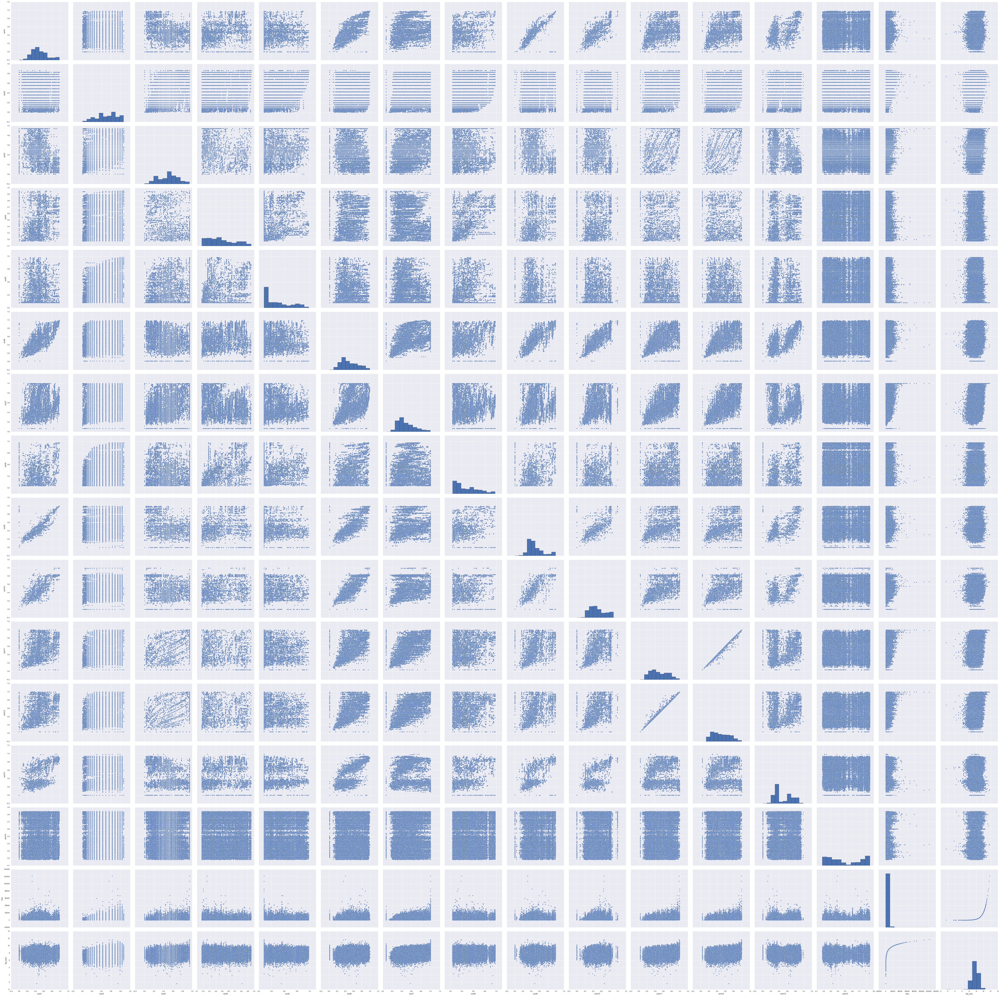

In [22]:
sns.pairplot(train.drop("id",axis=1),size=5)

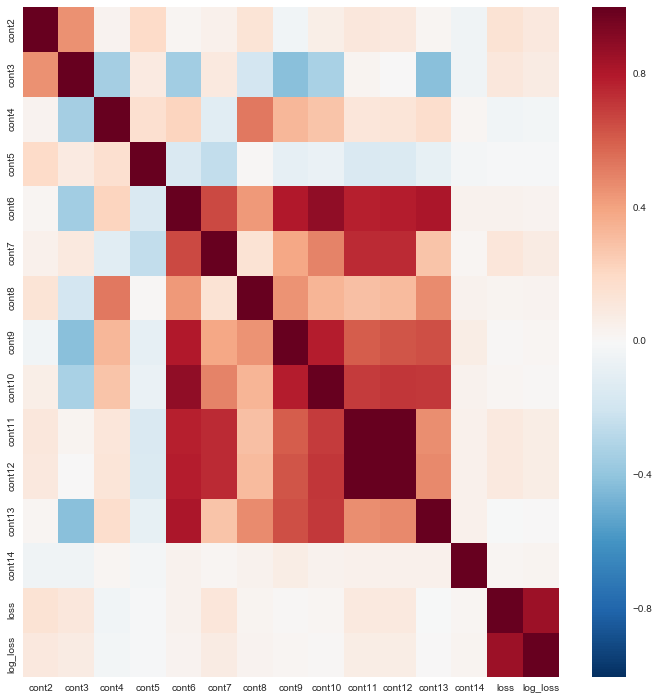

In [23]:
cols=train.select_dtypes(include = ['float64']).iloc[:,1:].corr()
plt.figure(figsize=(12,12))
sns.heatmap(cols,vmax=1)

Univariate and Bivariate for categorical variables

In [26]:
catFeatureslist = []
for colName,x in train.iloc[1,:].iteritems():
    if(str(x).isalpha()):
        catFeatureslist.append(colName)

In [30]:
from sklearn.preprocessing import LabelEncoder
le= LabelEncoder()
var_to_encode=list(data.dtypes.loc[data.dtypes=="object"].index)
for col in var_to_encode:
    data[col]= le.fit_transform(data[col])

In [31]:
filterG2 = list((data[catFeatureslist].apply(pd.Series.nunique) == 2))
catFeaturesG2List = [i for (i, v) in zip(catFeatureslist, filterG2) if v]
catFeaturesG2List.append("loss")

In [32]:
corrCatMatrix = data[catFeaturesG2List].corr().abs()

s = corrCatMatrix.unstack()
sortedSeries= s.order(kind="quicksort",ascending=False)

print("Top 5 most correlated categorical feature pairs: \n")
print(sortedSeries[sortedSeries != 1.0][0:9])

Top 5 most correlated categorical feature pairs: 

cat2   cat9     0.932173
cat9   cat2     0.932173
cat6   cat50    0.926161
cat50  cat6     0.926161
cat8   cat66    0.862360
cat66  cat8     0.862360
cat7   cat57    0.809763
cat57  cat7     0.809763
cat16  cat3     0.784408
dtype: float64


C:\Anaconda3\lib\site-packages\ipykernel\__main__.py:4: FutureWarning: order is deprecated, use sort_values(...)


In [33]:
data.head()

,cat1,cat10,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,...,cont3,cont4,cont5,cont6,cont7,cont8,cont9,id,loss,source
0,0,0,1,6,0,0,8,4,6,9,...,0.187583,0.789639,0.310061,0.718367,0.335060,0.30260,0.67135,1,2213.18,1
1,0,1,11,5,0,0,4,4,8,10,...,0.592681,0.614134,0.885834,0.438917,0.436585,0.60087,0.35127,2,1283.60,1
2,0,1,11,14,0,1,4,5,7,5,...,0.484196,0.236924,0.397069,0.289648,0.315545,0.27320,0.26076,5,3005.09,1
3,1,0,8,3,0,0,4,4,8,10,...,0.527991,0.373816,0.422268,0.440945,0.391128,0.31796,0.32128,10,939.85,1
4,0,1,5,9,0,0,3,4,10,6,...,0.527991,0.473202,0.704268,0.178193,0.247408,0.24564,0.22089,11,2763.85,1


In [36]:
train_encoded=data[data['source']==1].drop(['source'],axis=1)

In [37]:
train_encoded.head()

,cat1,cat10,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,...,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,id,loss
0,0,0,1,6,0,0,8,4,6,9,...,0.245921,0.187583,0.789639,0.310061,0.718367,0.335060,0.30260,0.67135,1,2213.18
1,0,1,11,5,0,0,4,4,8,10,...,0.737068,0.592681,0.614134,0.885834,0.438917,0.436585,0.60087,0.35127,2,1283.60
2,0,1,11,14,0,1,4,5,7,5,...,0.358319,0.484196,0.236924,0.397069,0.289648,0.315545,0.27320,0.26076,5,3005.09
3,1,0,8,3,0,0,4,4,8,10,...,0.555782,0.527991,0.373816,0.422268,0.440945,0.391128,0.31796,0.32128,10,939.85
4,0,1,5,9,0,0,3,4,10,6,...,0.159990,0.527991,0.473202,0.704268,0.178193,0.247408,0.24564,0.22089,11,2763.85


In [2]:
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn import cross_validation, metrics
from sklearn.grid_search import GridSearchCV

import matplotlib.pylab as plt
%matplotlib inline
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 12, 4


ImportError: No module named 'xgboost'

In [ ]:
target='loss'
IDcol = 'ID'

In [43]:
test_results = pd.read_csv('test_results.csv')
def modelfit(alg, dtrain, dtest, predictors,useTrainCV=True, cv_folds=5, early_stopping_rounds=50):
    
    if useTrainCV:
        xgb_param = alg.get_xgb_params()
        xgtrain = xgb.DMatrix(dtrain[predictors].values, label=dtrain[target].values)
        xgtest = xgb.DMatrix(dtest[predictors].values)
        cvresult = xgb.cv(xgb_param, xgtrain, num_boost_round=alg.get_params()['n_estimators'], nfold=cv_folds,
            metrics='auc', early_stopping_rounds=early_stopping_rounds, show_progress=False)
        alg.set_params(n_estimators=cvresult.shape[0])
    
    #Fit the algorithm on the data
    alg.fit(dtrain[predictors], dtrain['loss'],eval_metric='auc')
        
    #Predict training set:
    dtrain_predictions = alg.predict(dtrain[predictors])
    dtrain_predprob = alg.predict_proba(dtrain[predictors])[:,1]
        
    #Print model report:
    print "\nModel Report"
    print "Accuracy : %.4g" % metrics.accuracy_score(dtrain['loss'].values, dtrain_predictions)
    print "AUC Score (Train): %f" % metrics.roc_auc_score(dtrain['loss'], dtrain_predprob)
    
#     Predict on testing data:
    dtest['predprob'] = alg.predict_proba(dtest[predictors])[:,1]
    results = test_results.merge(dtest[['ID','predprob']], on='ID')
    print 'AUC Score (Test): %f' % metrics.roc_auc_score(results['loss'], results['predprob'])
                
    feat_imp = pd.Series(alg.booster().get_fscore()).sort_values(ascending=False)
    feat_imp.plot(kind='bar', title='Feature Importances')
    plt.ylabel('Feature Importance Score')


TypeError: unhashable type: 'slice'